# 本次项目设计代码主要包含五大模块：
## *目标检测*、*语义分割与聚类*、*简单分类*、*大模型分类*、*精确度分析*


# 代码文件结构：
>**code**
>>yolov5-master  **目标检测**

>>forVGG   **大模型分类**

>>codall   **语义分割与聚类**

>>datasets   **数据集（部分示例）**

>>inpainting **合成数据抠图**

>>GracoNet-Object-Placement **合成数据放置**

>>SVMImageClassification-master **简单分类模型**

>>display **其他文件**


# 0.System requirement 

我们建议使用 `linux Ubuntu` version>=Ubuntu 21.10  完成本次代码的运行

use  `cat /usr/local/cuda/version.txt` to see cuda version.  GPU is recomended and Cuda>=10.2

In [2]:
from PIL import Image

# 0.datasets

数据集和完整性代码放置在服务器端，查看我们的数据集可以使用`ssh`于我们的服务器建立连接。



In [2]:
!ssh user1@5.tcp.vip.cpolar.cn -p 10345  # port is (dynamic) changing with in 24 h. 

^C


我们使用了cplar构建内网穿透，并建立了稳定的TCP，端口号不同，登录服务器请向`auther` 索要端口号和密码
详细信息参见[cpolar使用](https://www.cpolar.com/) 、[SSH远程连接linux](https://blog.csdn.net/Hellowenpan/article/details/82904109)

初始数据集位于  `/home/user1/yolo/jiafei_projects/yolo_dataset` labels 包含 `xml`和`txt` 两种

图片分类模型数据集位于 `/home/user1/yolo/jiafei_projects/yolo_model/predict_res`

同时也可以在终端输入另一服务器ssh连接
如果想要远程观察我们的tensorboard结果，请提前建立代理连接将服务器端`127.0.0.1:8080` ${tesorboard-logfile} 与本地  `127.0.0.1:8877` 建立连接

In [ ]:
!ssh lws@47.97.51.98 -p 6001 -L 127.0.0.1:8887:127.0.0.1:8080

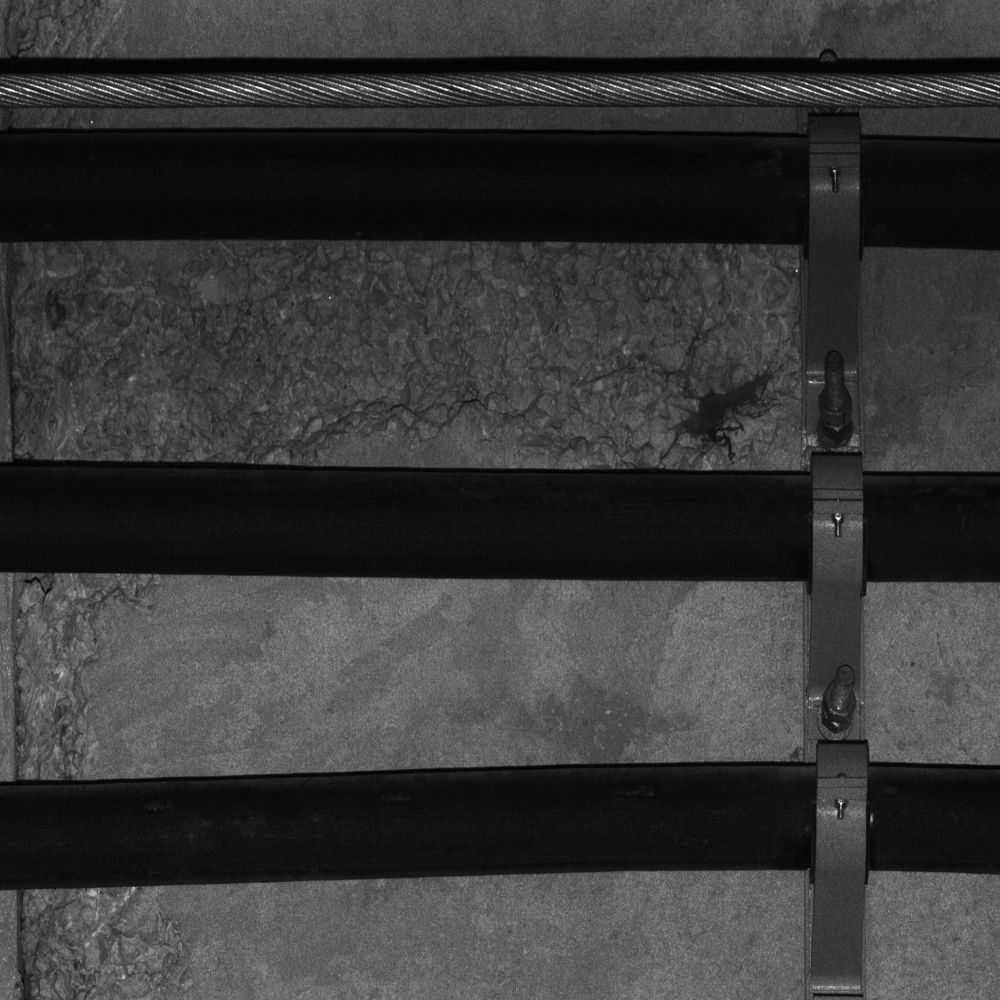

In [12]:
display(Image.open('code/display/x_3_508_00.png'))

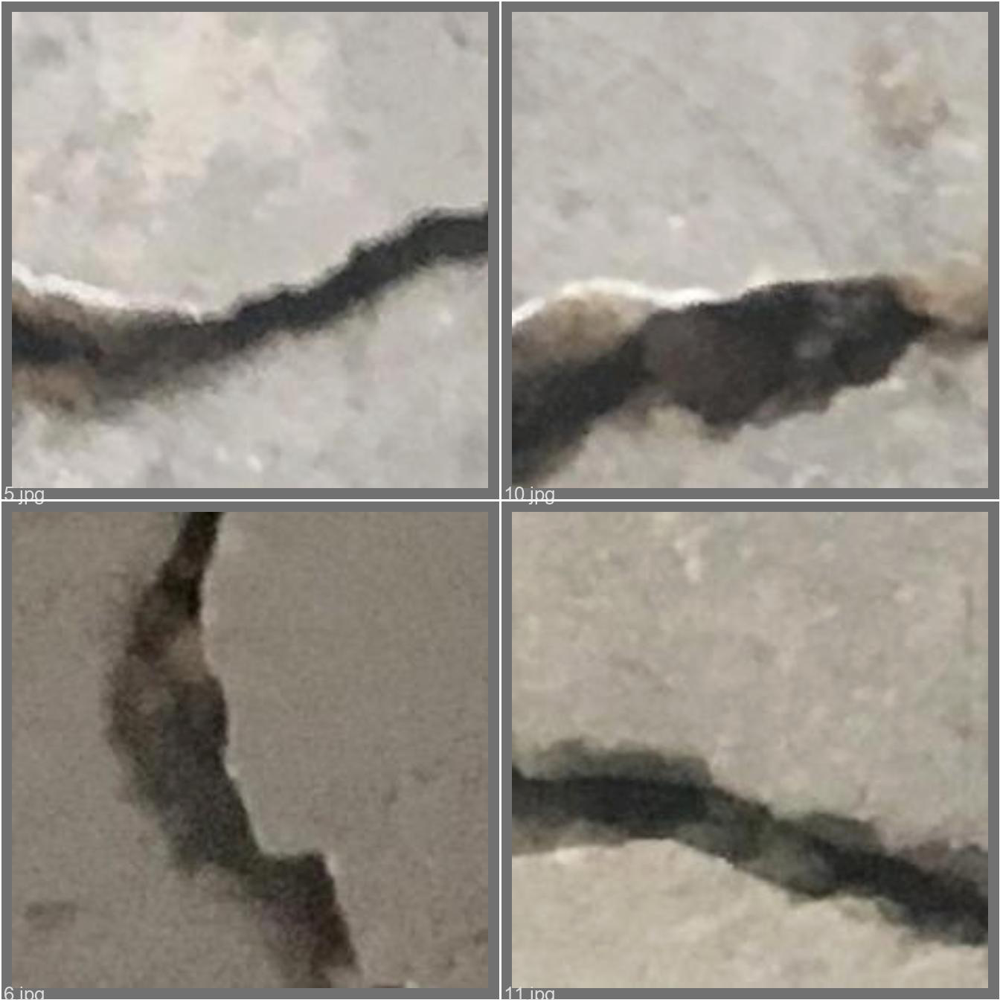

In [13]:
display(Image.open('code/yolov5-master/runs/train/exp24/val_batch1_pred.jpg'))

# 1.目标检测

采用yolov框架进行病害提取，原理详见 [COCO val 2017](https://github.com/ultralytics/yolov5/blob/74b34872fdf41941cddcf243951cdb090fbac17b/data/coco.yaml#L14) dataset (1GB - 5000 images)  
https://github.com/Hou-yanbin/yolov5-master

Inference  run  `python detect.py`、 train with our own datasets  run `python train.py --{your expir name}`

采取`block` \ `leak` \ `crack` 三种病害标注并提取


In [ ]:
# Run YOLOv5x on COCO val
!python val.py --weights yolov5x.pt --data coco.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/data/coco.yaml, weights=['yolov5x.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True
YOLOv5 🚀 v6.0-48-g84a8099 torch 1.10.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)

100% 166M/166M [00:03<00:00, 54.1MB/s]

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
val: Scanning '../datasets/coco/val2017' images and labels...4952 found, 48 missing, 0 empty, 0 corrupted: 100% 5000/5000 [00:01<00:00, 2636.64it/s]
val: New cache created: ../datasets/coco/val2017.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 157/157 [01:12<00:00,  2.17it/s]
                 all       5000      36335      0.729       0.63      0.683      0.496
Speed: 0.1ms pre-process, 4.9ms inference, 1.9ms NMS per image a

In [ ]:
# Run YOLOv5x on COCO val
!python val.py --weights yolov5x.pt --data coco.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/data/coco.yaml, weights=['yolov5x.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True
YOLOv5 🚀 v6.0-48-g84a8099 torch 1.10.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)

100% 166M/166M [00:03<00:00, 54.1MB/s]

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
val: Scanning '../datasets/coco/val2017' images and labels...4952 found, 48 missing, 0 empty, 0 corrupted: 100% 5000/5000 [00:01<00:00, 2636.64it/s]
val: New cache created: ../datasets/coco/val2017.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 157/157 [01:12<00:00,  2.17it/s]
                 all       5000      36335      0.729       0.63      0.683      0.496
Speed: 0.1ms pre-process, 4.9ms inference, 1.9ms NMS per image a

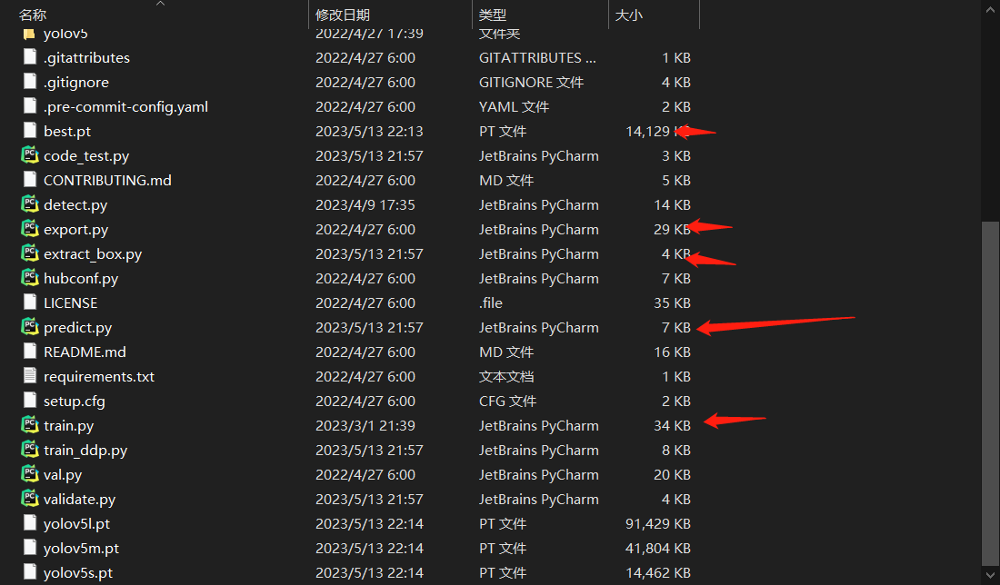

In [14]:
display(Image.open('code/display/display_yolov.png'))

see results by ssh `/home/user1/yolo/jiafei_projects/yolo_model/predict_res`

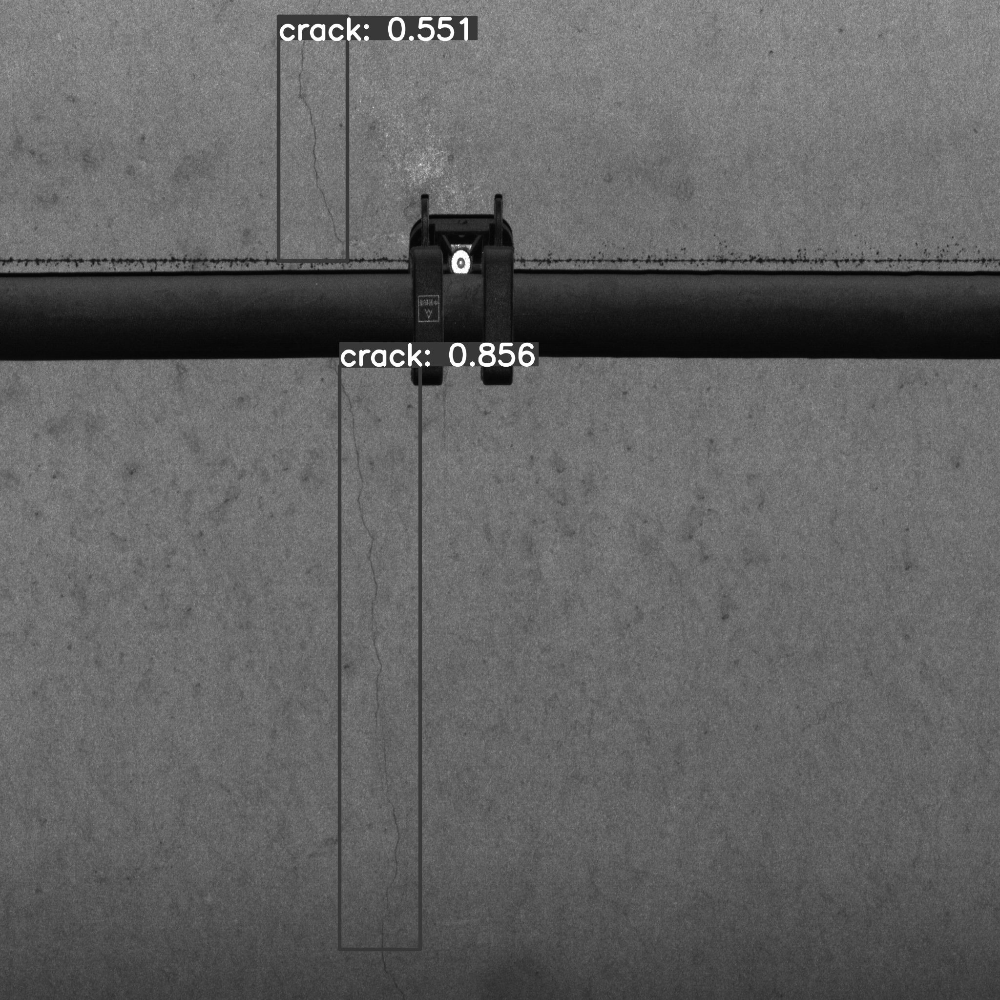

In [15]:

display(Image.open('code/display/s_2_735_31.png'))

# 2. 聚类

代码复现详细参见 `code\cluster_maskrcnn [A]clustering.ipynb [A]maskrcnn评价聚类结果.ipynb` 里面有详细的指导步骤

## + 去噪

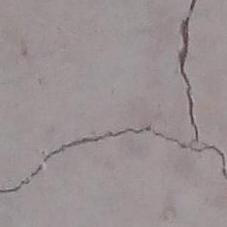

In [16]:
display(Image.open('code/cluster_maskrcnn/0001174.jpg'))

## + 腐蚀膨胀

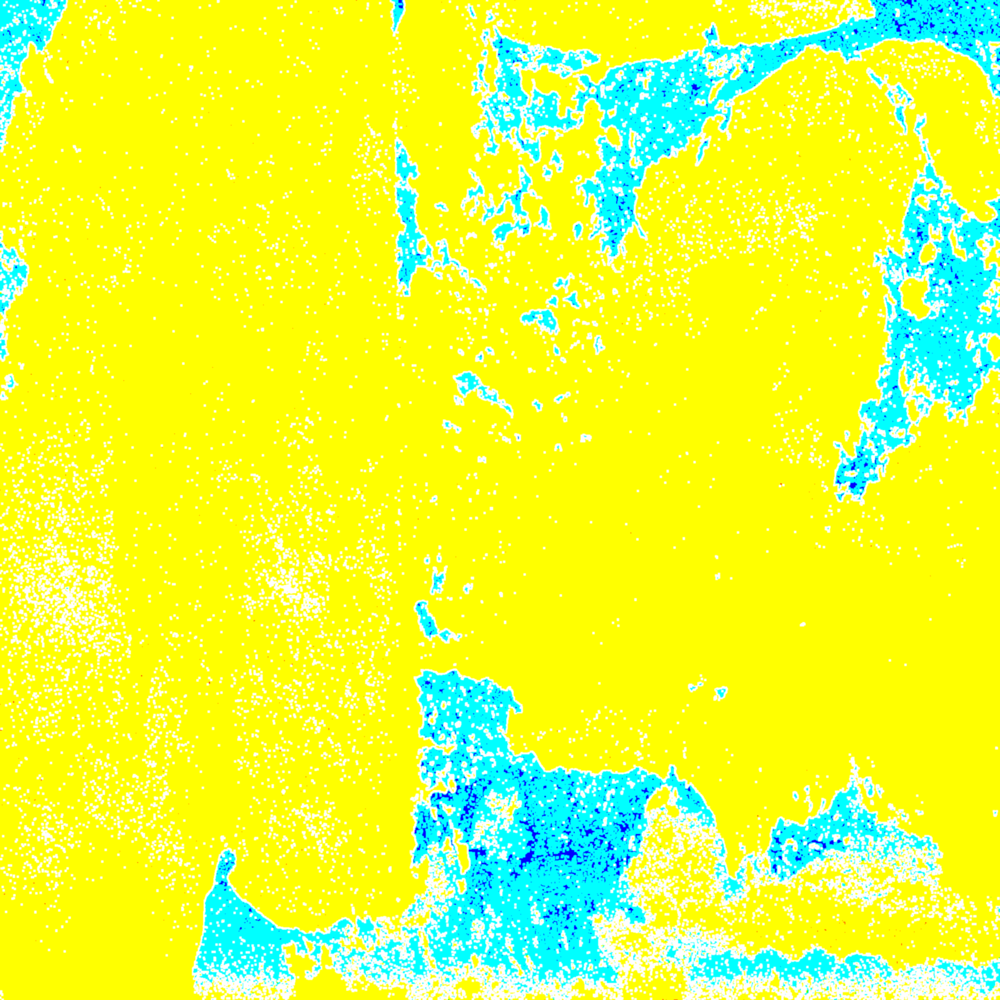

In [18]:

display(Image.open('code/cluster_maskrcnn/imggaus.png'))

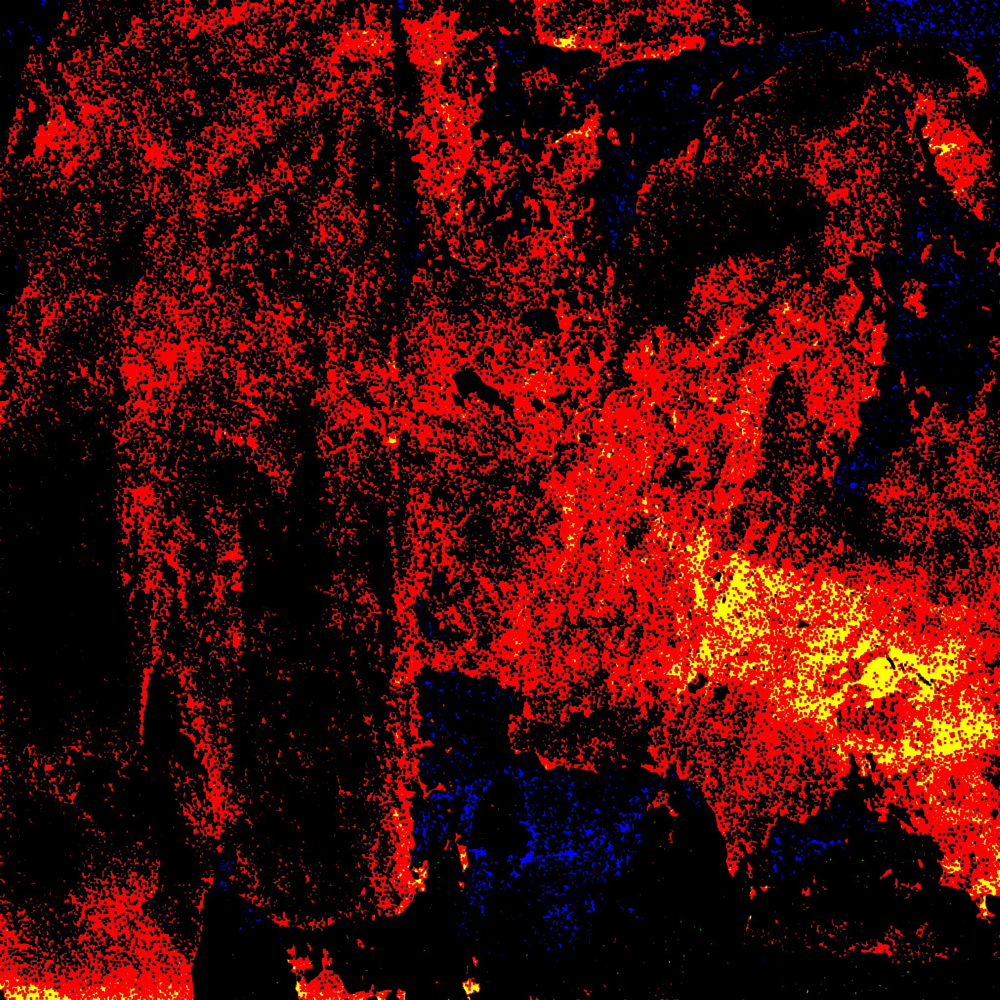

In [19]:

display(Image.open('code/cluster_maskrcnn/img11.png'))

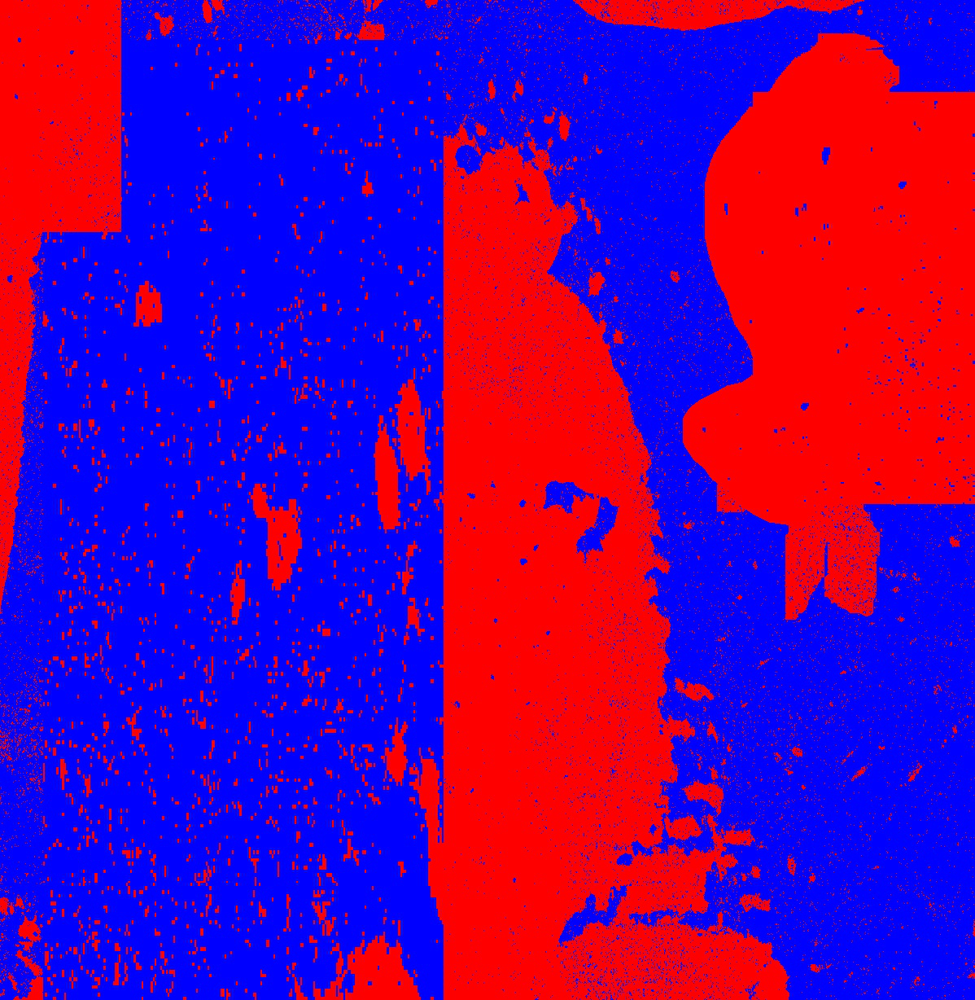

In [21]:

display(Image.open('code/display/waji_denoise_k16.jpg'))


## use tensorboard 
run below 

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

# 3. maskrcnn

## - environment

>numpy;
>scipy;
>Pillow;
>cython;
;
>matplotlib;

>scikit-image;
>tensorflow>=1.3.0;
>keras>=2.0.8;
>opencv-python;

>h5py;
>imgaug;
>IPython[all]

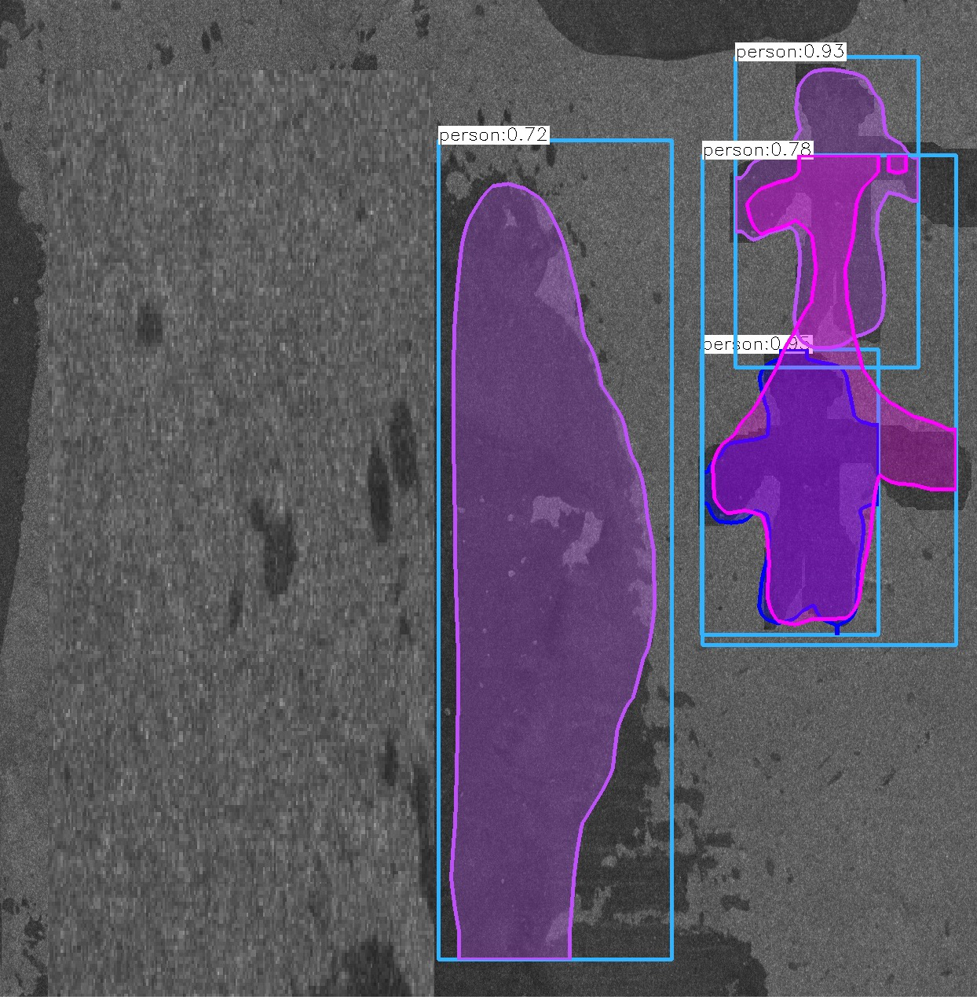

In [20]:

display(Image.open('code/display/forthat_20_mask_rcnn_out_py.jpg'))


# 4.合成数据

inpainting+ objectPlacement
我们参照JiahuiYu 对Inpainting的分析过程


@article{yu2018generative,
  title={Generative Image Inpainting with Contextual Attention},
  author={Yu, Jiahui and Lin, Zhe and Yang, Jimei and Shen, Xiaohui and Lu, Xin and Huang, Thomas S},
  journal={arXiv preprint arXiv:1801.07892},
  year={2018}
}

@article{yu2018free,
  title={Free-Form Image Inpainting with Gated Convolution},
  author={Yu, Jiahui and Lin, Zhe and Yang, Jimei and Shen, Xiaohui and Lu, Xin and Huang, Thomas S},
  journal={arXiv preprint arXiv:1806.03589},
  year={2018}
}

## Requirements:
Install python3  
Install tensorflow (tested on Release 1.3.0, 1.4.0, 1.5.0, 1.6.0, 1.7.0).  
Install tensorflow toolkit neuralgym (run pip install git+https://github.com/JiahuiYu/neuralgym).  

#### Training:  
Prepare training images filelist and shuffle it (example).  
Modify inpaint.yml to set DATA_FLIST, LOG_DIR, IMG_SHAPES and other parameters.  
Run python train.py.  

#### Resume training:
Modify `MODEL_RESTORE` flag in `inpaint.yml`. E.g., MODEL_RESTORE: 20180115220926508503_places2_model.  
Run `python train.py.`  
Testing:  
Run python test.py `--image examples/input.png --mask examples/mask.png --output examples/output.png --checkpoint`   `model_logs/your_model_dir.`  


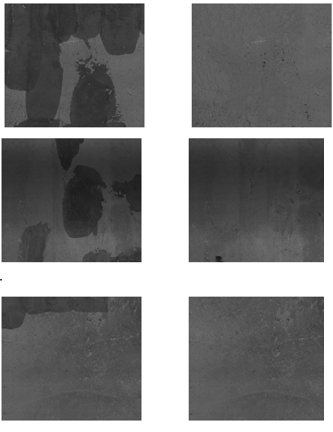

In [24]:
display(Image.open('code/inpainting/inpainting.png'))

see `code/inpainting/examples/places2` for the trial picture

see more result by `ssh lws@47.97.51.98 -p 6001`  \ `/home/lws/training_data/long`

### objectplacement 
### 我们实现了

2023-05-01 22:27:59.832766
 - Accuracy = 0.600





### eval 详见 ssh
 `/home/user1/GracoNet-Object-Placement/MOCS2OPA`

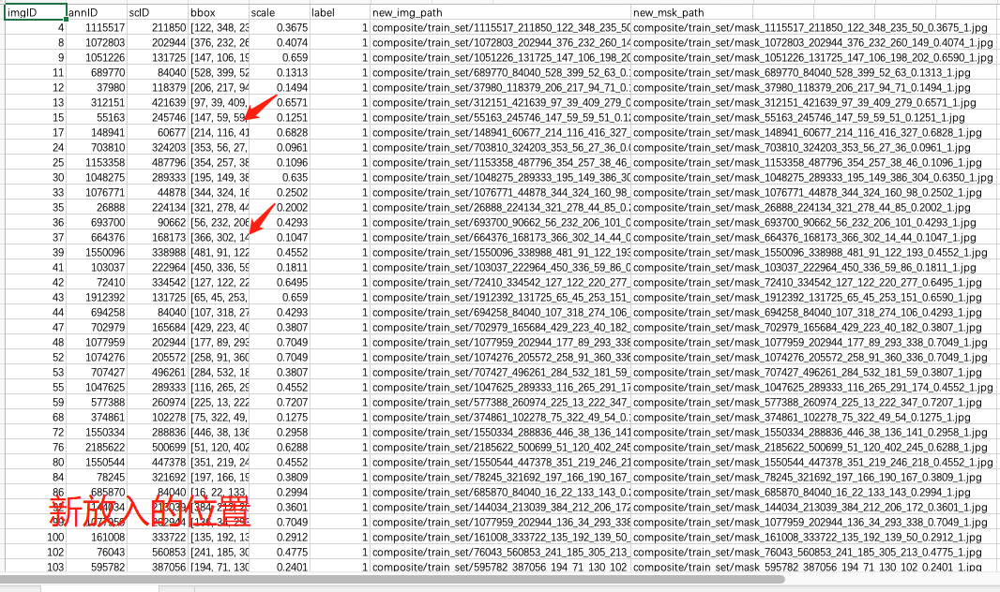

In [28]:
display(Image.open('code/display/granocate.png'))

# 5. 分类模型
#### environment see `/code/SVMImageClassification-master/requirements.txt`
#### dependency see  `/code/SVMImageClassification-master/readme.txt`

one trial below

我们的数据集没有放入文件中，如果要用隧道数据集运行，请修改各个机器学习代码中的 `os.listdir("photo2/%s" % i):` 中的路径

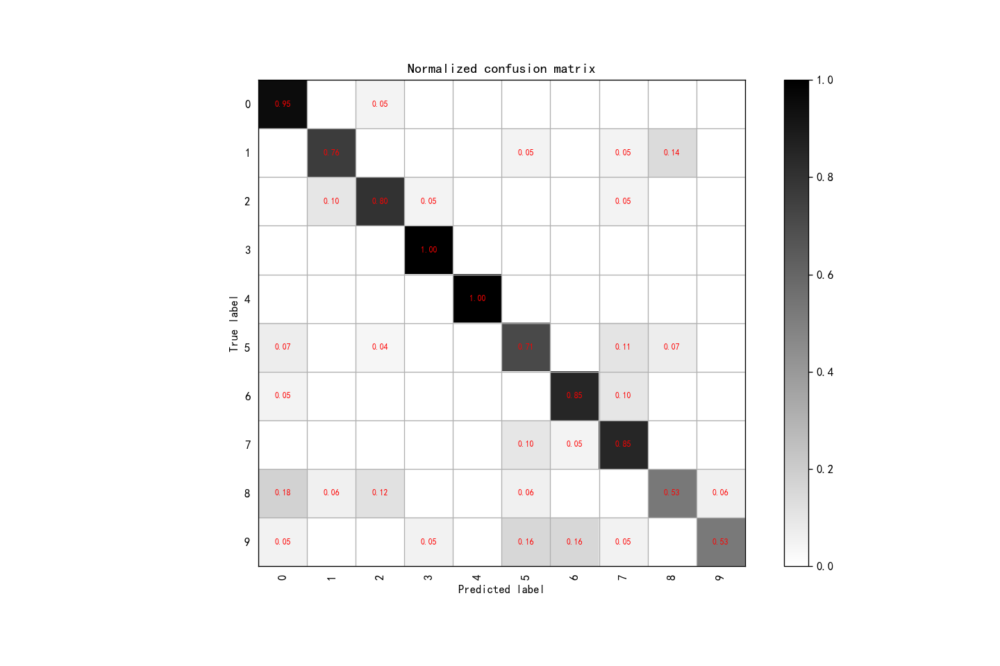

In [29]:
display(Image.open('code/SVMImageClassification-master/matrix.png'))


`code/forVGG/aevall.py` 专门用来输出AP precision_score 混淆矩阵等值

In [32]:
array=([[2, 0, 0],
       [0, 0, 1],
       [1, 0, 2]])
array

[[2, 0, 0], [0, 0, 1], [1, 0, 2]]

### 我们汇总得到的图像特征提取文件为 `train_data.csv`

# 6 分类大模型

VGG模型训练   
` cd code/forVGG/`  run ` python  agptesst.py` for inference     
 run  `train.py` for train
 
模型微调  
运行 `python forVGG\Fintune_table\fintt.py` 将路径调整成数据集所在位置，运行可进行模型微调训练

## dependency： environment



In [ ]:

import torch
import torch.nn as nn
from torchvision import transforms, datasets
from torch.utils.data.dataloader import DataLoader
from torch import optim
from tqdm import tqdm
from torch.autograd import Variable




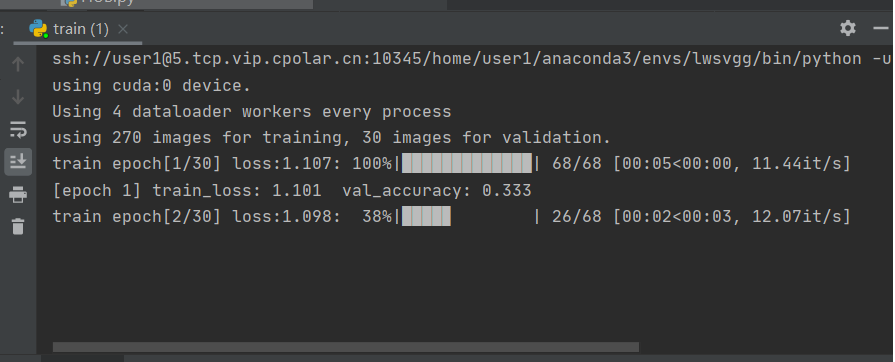

In [36]:
display(Image.open('code/display/vgg.png'))
!python train.py

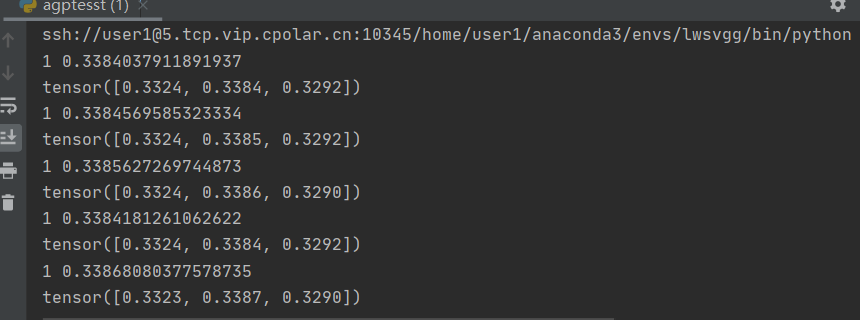

In [38]:
display(Image.open('code/display/aptext.png'))

# 另外我们还使用DeepLearningExamples 为我们大模型分类加以训练

### 用 `DeepLearningExamples/PyTorch/Classification/GPUNet` 配置
 train run `python train.py`  test run `python validate.py`  eval run `python eval.py`

# 同时使用API 进行辅助 也是重要方法

### 详细可见 [clrifai](https://clarifai.com/datastrategy/MAIN-image-moderation/models/moderation-all-resnext-2)
我们使用 `withA.py`\ `withAPI.py` \ `withAPIforclassification.py`

我们的workflow 如下

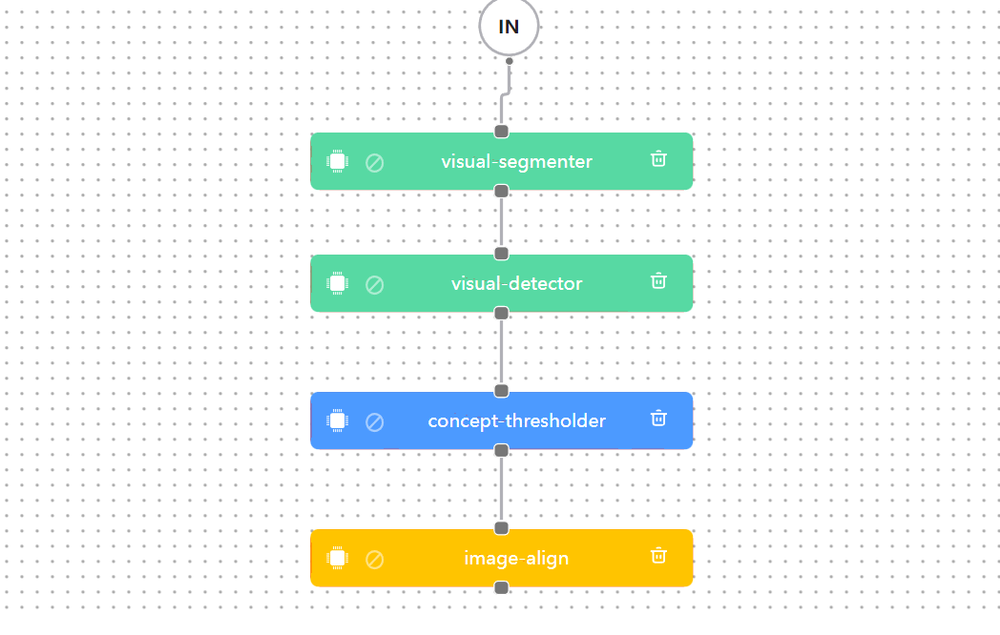

In [5]:
display(Image.open('code/forVGG/our_workflow.png'))